# Projection

Description

In [1]:
# Reload the notebook if an external file is updated
%load_ext autoreload
%autoreload 2

import os
import sys
import warnings

from pathlib import Path

path = (
    Path
    .cwd()
    .parent
    .parent
    .joinpath('warbler')
    .as_posix()
)

os.chdir(path)
sys.path.append(path)

warnings.simplefilter(
    'ignore', 
    TqdmExperimentalWarning
)

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import scienceplots

from avgn.signalprocessing.create_spectrogram_dataset import flatten_spectrograms
from avgn.visualization.projections import (
    scatter_projections,
    scatter_spec,
    draw_projection_transitions,
)
from avgn.visualization.quickplots import draw_projection_plots
from avgn.visualization.spectrogram import draw_spec_set
from datatype.dataset import Dataset
from datatype.spectrogram import flatten
from umap import UMAP

In [ ]:
plt.style.use('science')

In [3]:
dataset = Dataset('avgn')
dataframe = dataset.load()

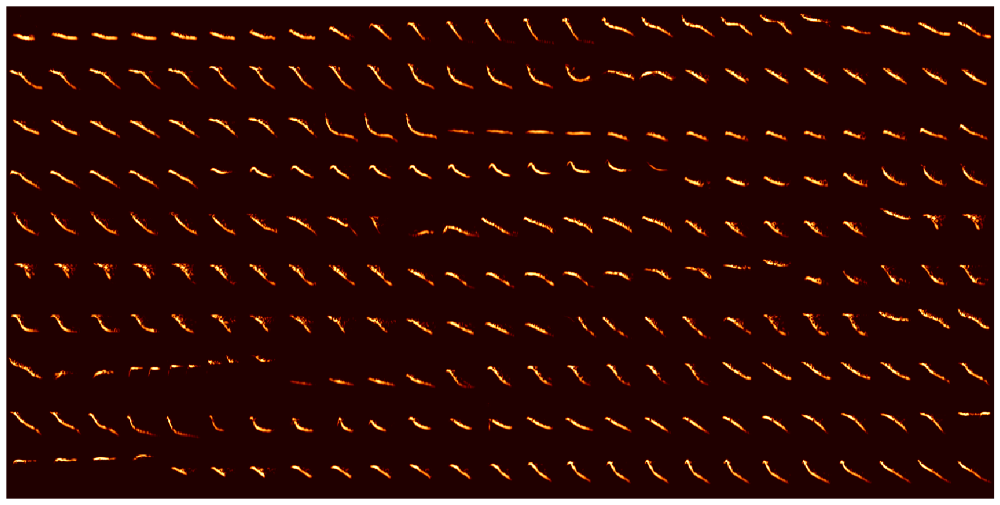

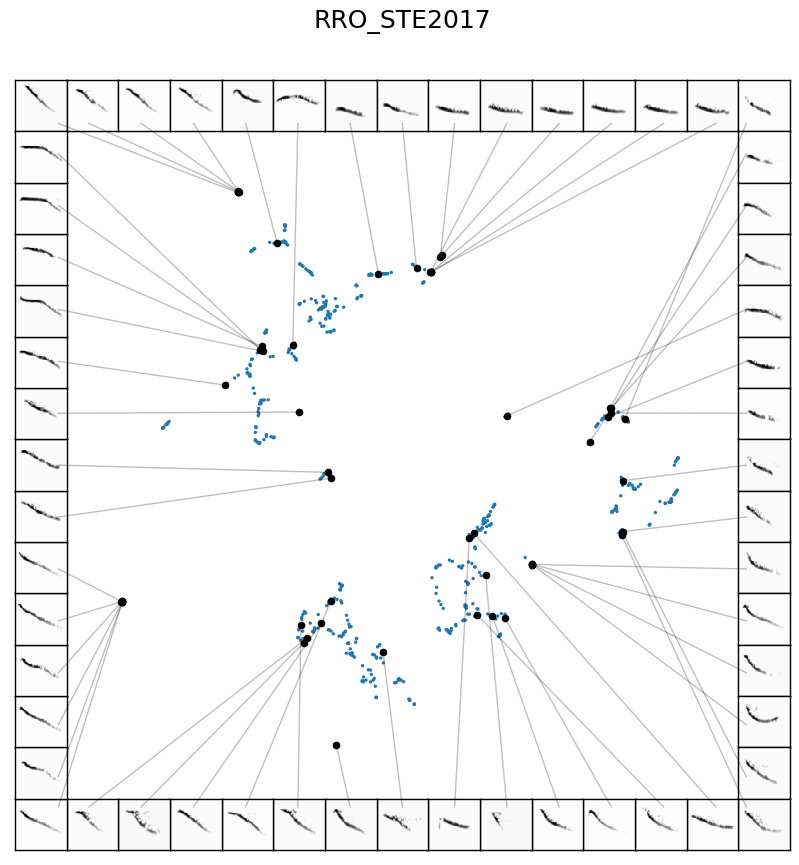

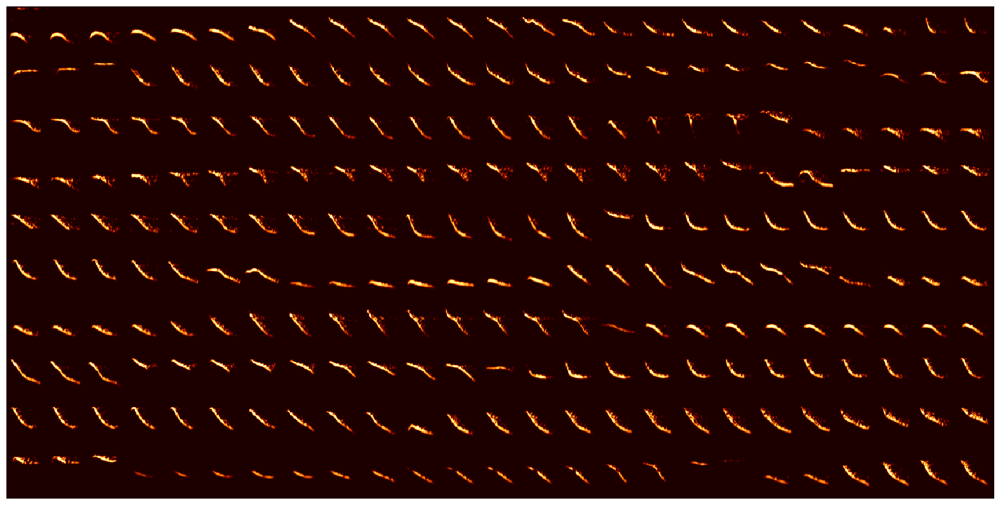

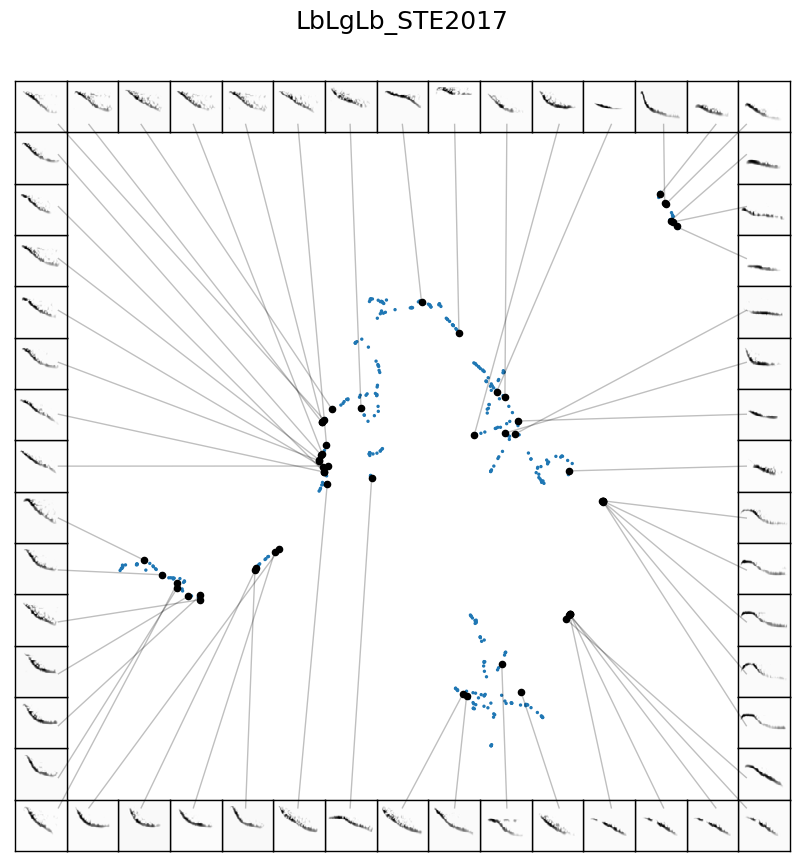

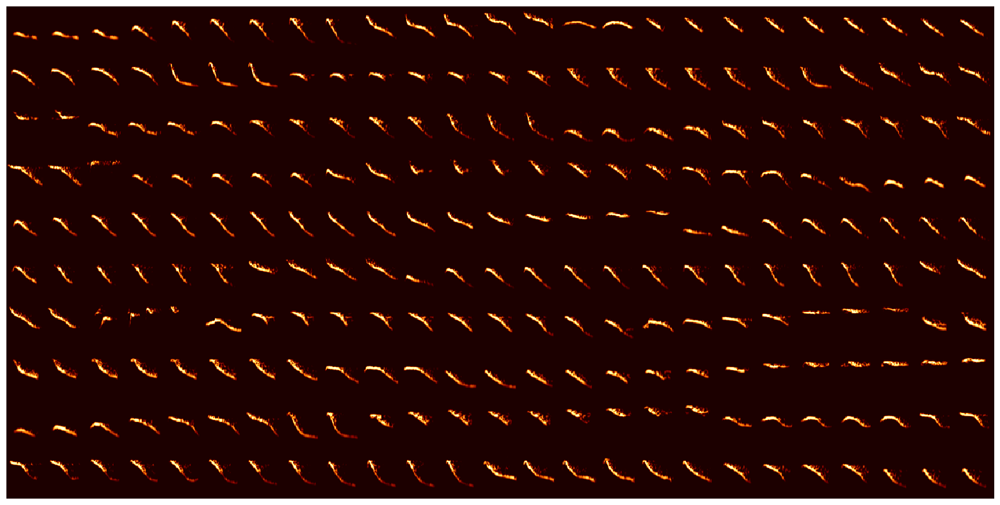

...

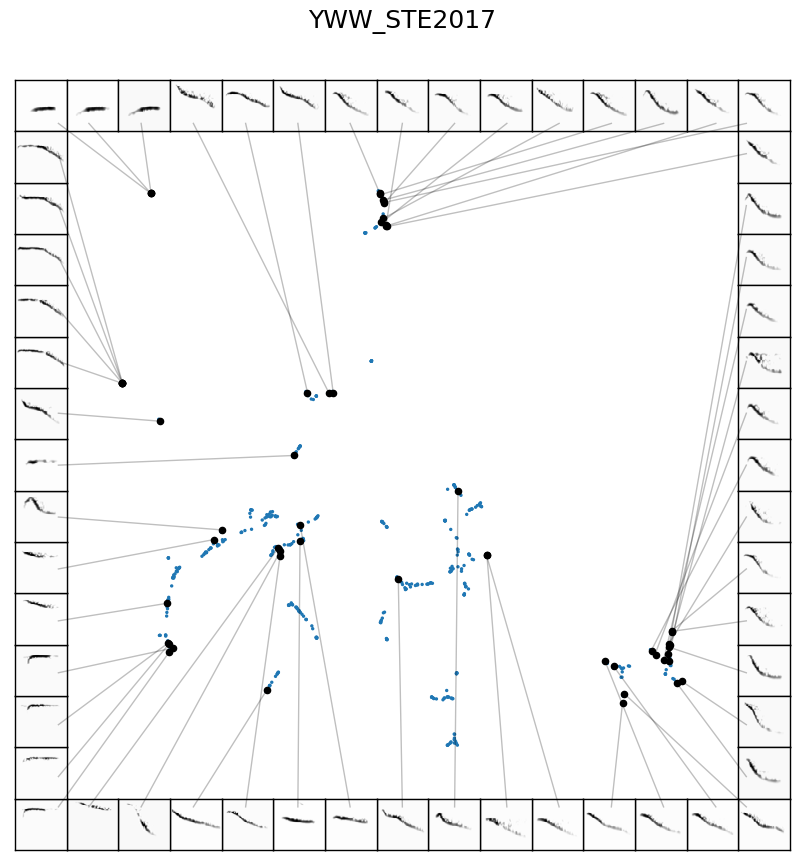

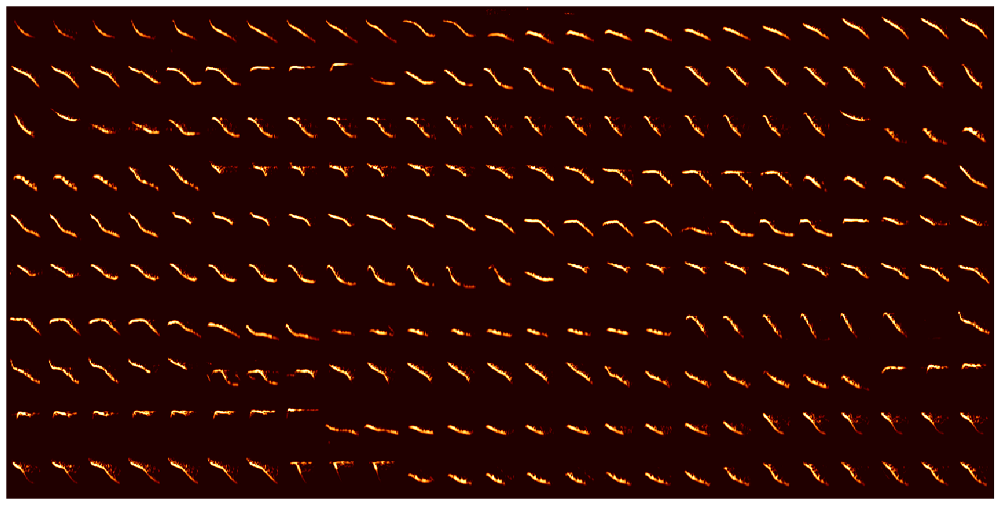

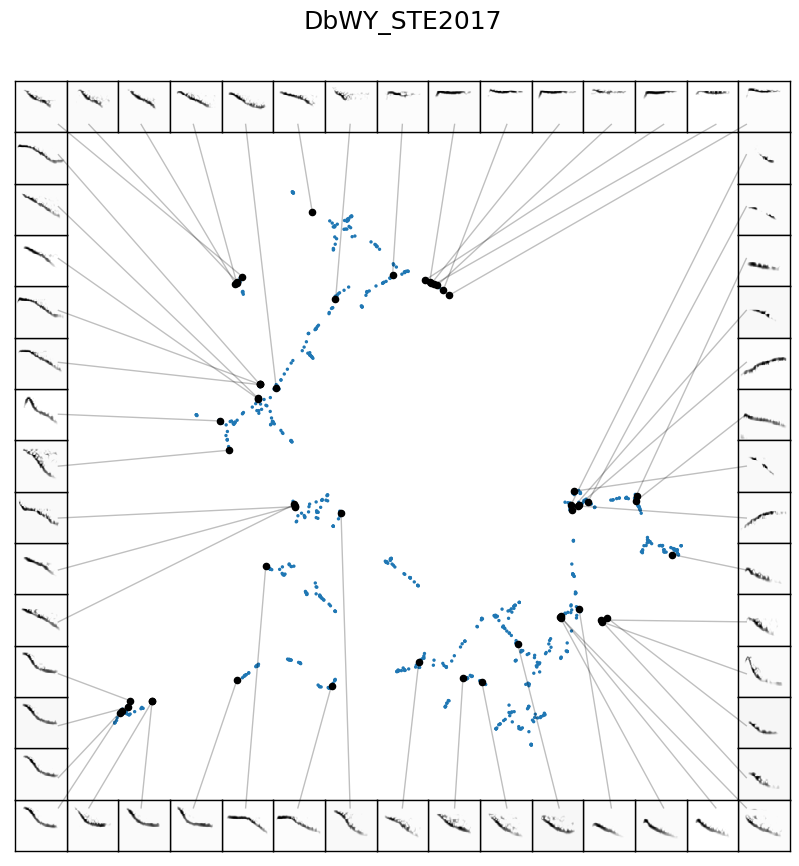

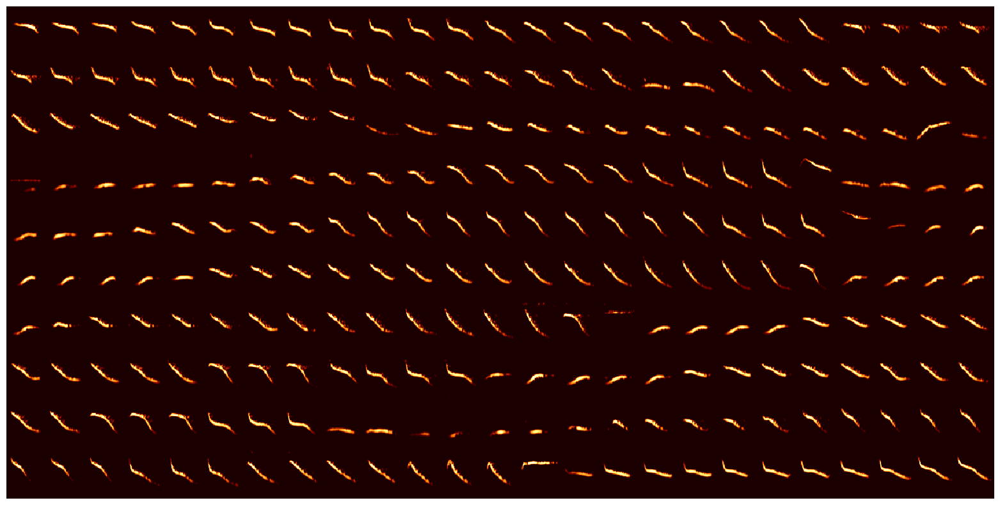

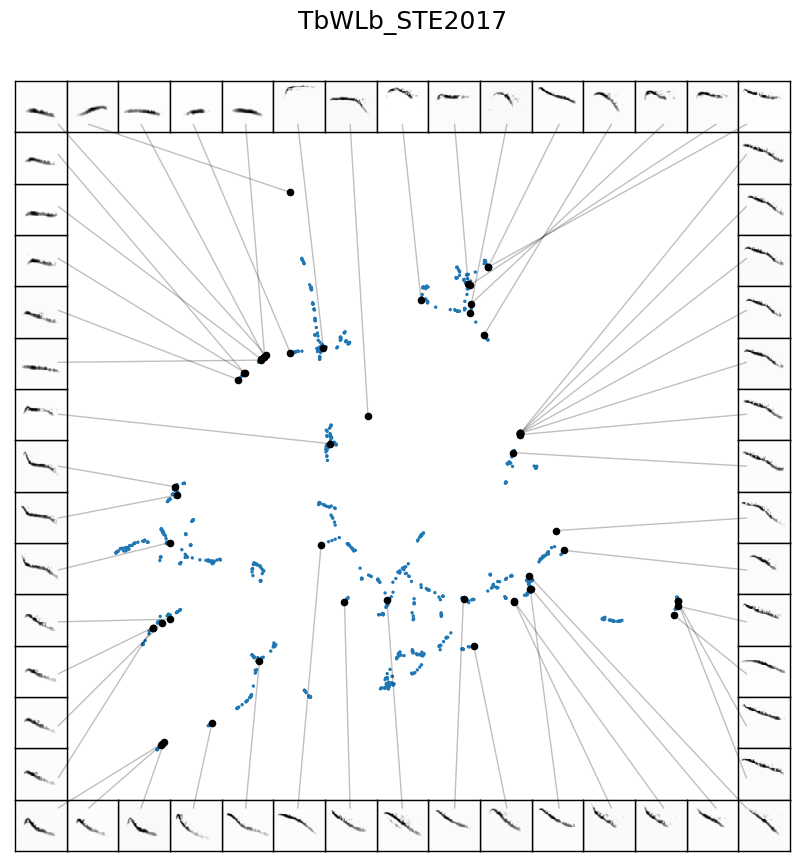

In [4]:
for indv in dataframe.indv.unique():
    individual = dataframe[dataframe.indv == indv]

    spectrogram = individual.spectrogram.tolist()
 
    draw_spec_set(
        spectrogram, 
        zoom=1, 
        maxrows=10, 
        colsize=25
    )
        
    by = ['start_time']
    ascending = [True]
    
    individual = individual.sort_values(ascending=ascending, by=by)
    spectrogram = individual.spectrogram.tolist()

    flattened = flatten_spectrograms(spectrogram)
    
    fit = UMAP(
        low_memory=True,
        metric='euclidean',
        min_dist=0.0,
        n_neighbors=5,
        n_components=2,
        n_jobs=-1
    )
    
    projection = fit.fit_transform(flattened)
    projection = list(projection)
    
    individual['umap'] = projection

    labels = individual.indv.tolist()
    
    _, _, ax, _ = scatter_spec(
        projection,
        spectrogram,
        column_size=15,
        pal_color='hls',
        color_points=False,
        enlarge_points=20,
        figsize=(10, 10),
        scatter_kwargs = {
            'labels': labels,
            'alpha': 1,
            's': 2,
            'show_legend': False
        },
        matshow_kwargs = {
            'cmap': plt.cm.Greys
        },
        line_kwargs = {
            'lw': 1,
            'ls': 'solid',
            'alpha': 0.25,
        },
        draw_lines=True
    )

    ax.set_title(
        indv,
        fontsize=18,
        pad=75
    )

    plt.show()
    plt.close()